In [2]:
import numpy as np
import cv2 
import matplotlib.pyplot as plt
import os
from tqdm import tqdm
from sklearn.cluster import DBSCAN, OPTICS
from scipy.ndimage import sobel
import scipy


plt.rcParams['image.origin'] = 'lower'
plt.rcParams['image.cmap'] = 'gray'
np.set_printoptions(suppress=True)


In [3]:
dir = '/Users/mleclair/phd/code/dunex/data/argus'
file = 'ArgusFF_20211013T170100Z_RectifiedVideo.avi'
os.path.join(dir, file) 

'/Users/mleclair/phd/code/dunex/data/argus/ArgusFF_20211013T170100Z_RectifiedVideo.avi'

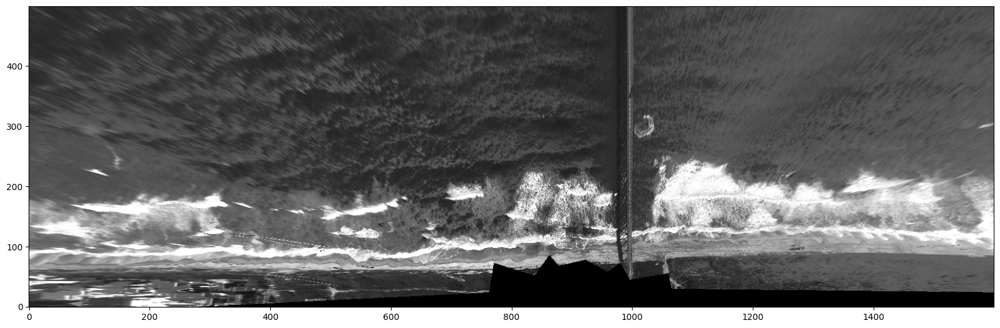

In [4]:
cap = cv2.VideoCapture(os.path.join(dir, file))
_, frame = cap.read()
frame = frame[..., 0]
plt.figure(figsize=(20, 30))
plt.imshow(frame.T)
cap.release()
cv2.destroyAllWindows()

In [5]:
cap = cv2.VideoCapture(os.path.join(dir, file))
N = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
W = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
H = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
print(f'{np.zeros((N, W), dtype=np.uint8).nbytes/1000/1000}mb per timestack')

# NOTE: We're downsampling in along-shore to 10m
skip = 1
timestack = np.zeros((N, H//skip, W))


for i in tqdm(range(N)):
    _, frame = cap.read()
    timestack[i] = frame[::skip, :, 0]

cap.release()
cv2.destroyAllWindows()

1.92mb per timestack


100%|██████████| 3840/3840 [00:05<00:00, 665.12it/s]


Text(0.5, 1.0, 'Missing Data')

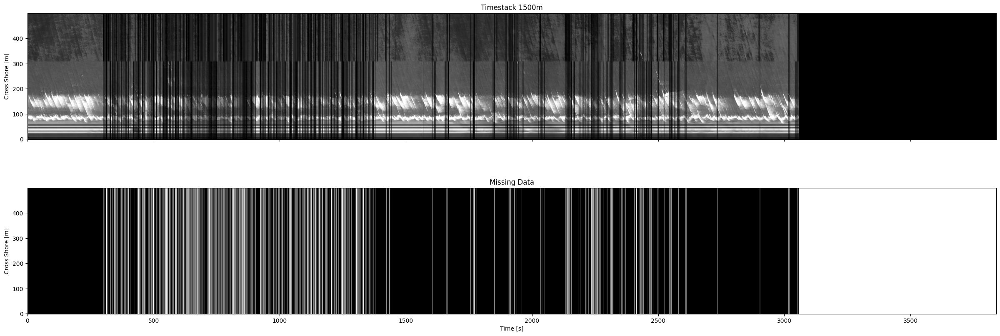

In [6]:
i = 150
t = timestack[:, 0, :].T
fig, axs = plt.subplots(2, 1, figsize=(30, 10), sharex=True)
axs[0].set_title(f'Timestack {i*10}m')
axs[0].imshow(t)
axs[0].set_ylabel('Cross Shore [m]')
im = axs[1].imshow((np.zeros_like(t) + np.all((t==0), axis=0)[:, np.newaxis].T))
axs[1].set_xlabel('Time [s]')
axs[1].set_ylabel('Cross Shore [m]')
plt.title('Missing Data')

(0.0, 300.0)

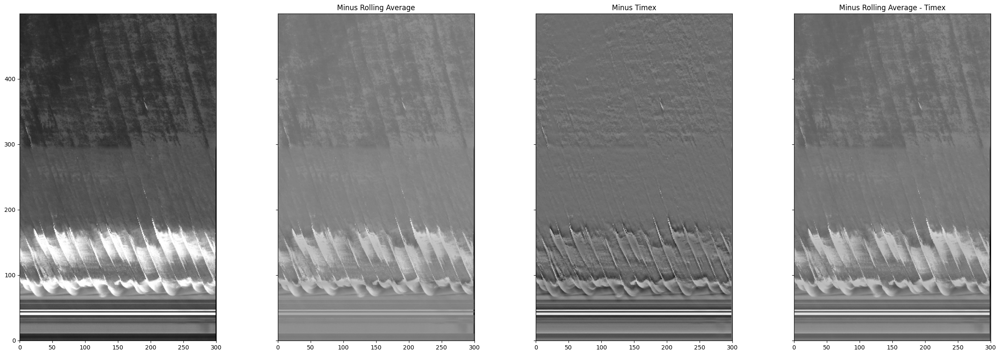

In [7]:
from scipy.ndimage import uniform_filter1d
def normalize(x, scale=255):
    x = (x - x.min())
    return x/x.max() * scale
t = timestack[:, 49, :]
# t[t==0] = np.nan
NFRAMES = 20
fig, axs = plt.subplots(1, 4, sharey=True, figsize=(30, 10))
axs[0].imshow(t.T, vmin=0, vmax=255)
axs[1].imshow(normalize(t - uniform_filter1d(t, t.shape[0], axis=0)).T, vmin=0, vmax=255)
axs[1].set_title('Minus Rolling Average')
axs[2].imshow((normalize(t - uniform_filter1d(t, NFRAMES, axis=1)).T))
axs[2].set_title('Minus Timex')
axs[3].imshow(normalize(t - uniform_filter1d(uniform_filter1d(t, N, axis=0), NFRAMES, axis=1)).T)
axs[3].set_title('Minus Rolling Average - Timex')
axs[0].set_xlim([0, 300])
axs[1].set_xlim([0, 300])
axs[2].set_xlim([0, 300])
axs[3].set_xlim([0, 300])


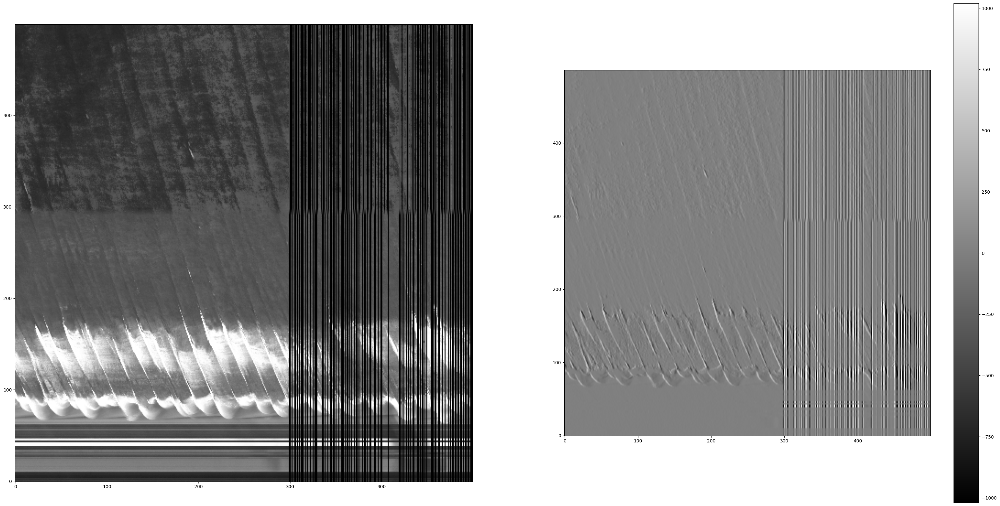

In [8]:
from scipy.ndimage import sobel
fig, axs = plt.subplots(1, 2, figsize=(40,20))
axs[0].imshow((timestack[:500, 50, :].T))
im = axs[1].imshow(sobel(timestack[:500, 50, :].T))
fig.colorbar(im, ax=axs[1])

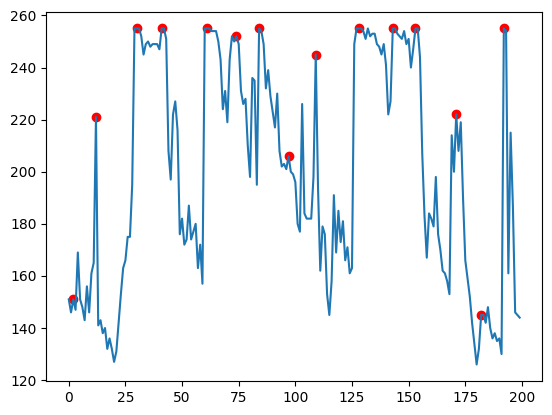

In [9]:
import scipy
plt.plot((timestack[:200, 50, 150].T))
peaks = scipy.signal.find_peaks((timestack[:200, 50, 150].T), distance=10)[0]
plt.scatter(peaks, (timestack[:200, 50, 150].T)[peaks], c='r')

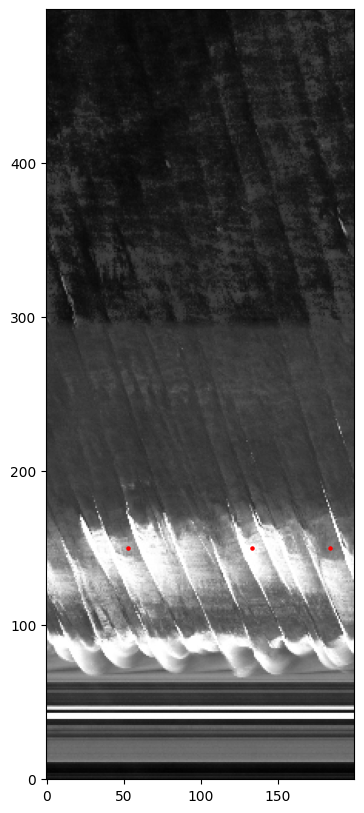

In [10]:
plt.figure(figsize=(20, 10))
plt.imshow(timestack[:200, 50, :].T)
peaks = scipy.signal.find_peaks((timestack[:200, 50, 175].T), threshold=10)[0]
plt.scatter(peaks, np.ones_like(peaks) * 150, c='r', s=5)

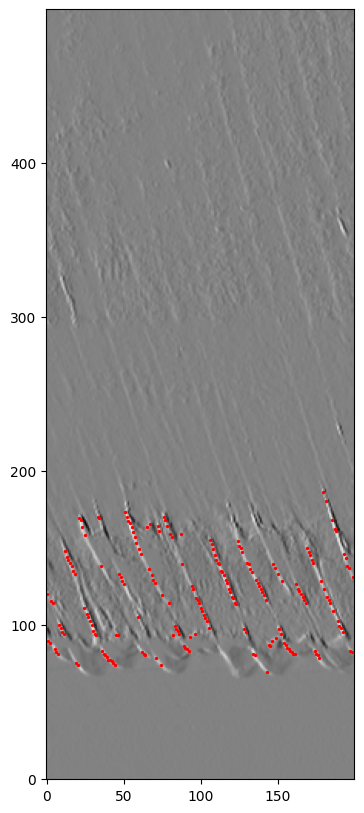

In [11]:
plt.figure(figsize=(20, 10))
plt.imshow(sobel(timestack[:200, 50, :].T))
plt.scatter(np.arange(200), np.argmax(sobel(timestack[:200, 50, :].T), axis=0), c='r', s=2)

In [12]:
timestack.shape

(3840, 1600, 500)

In [41]:
peaks = []
c=5
for i in tqdm(range(0, 1600)):
    surf_zone_min = 65
    surf_zone_max = 275
    p = np.argsort(sobel(timestack[:, i, surf_zone_min:surf_zone_max].T), axis=0)[::-1][:c]
    peaks.append(
        p+surf_zone_min
    )
peaks = np.array(peaks)
peaks = np.swapaxes(peaks, 1, 2)
peaks = np.swapaxes(peaks, 0, 1)

100%|██████████| 1600/1600 [00:40<00:00, 39.33it/s]


In [53]:
peaks.shape

(3840, 1600, 5)

: 

In [42]:
N_T, N_X, N_Y = timestack.shape

In [43]:
N_PEAKS = peaks.shape[2]
flat_peaks = np.array(
    [
        np.array([np.arange(N_T)]*N_PEAKS*N_X).T.flatten(),
        np.array([np.arange(N_X)]*N_PEAKS*N_T).flatten(),
        peaks.flatten()
    ]
)
flat_peaks.shape

(3, 30720000)

In [44]:
flat_peaks

array([[   0,    0,    0, ..., 3839, 3839, 3839],
       [   0,    1,    2, ..., 1597, 1598, 1599],
       [ 173,  172,  154, ...,  141,  140,  139]])

In [45]:
# clusters = OPTICS(min_samples=10, max_eps=3, n_jobs=-1).fit(flat_peaks.T)

In [46]:
clustering = DBSCAN(eps=3, min_samples=20).fit(flat_peaks.T)
labels = clustering.labels_

In [47]:
flat_peaks

array([[   0,    0,    0, ..., 3839, 3839, 3839],
       [   0,    1,    2, ..., 1597, 1598, 1599],
       [ 173,  172,  154, ...,  141,  140,  139]])

In [48]:
flat_peaks[2,...][flat_peaks[1]==50].shape

(19200,)

In [49]:
labels

array([   -1,    -1,    -1, ..., 30348, 30348, 30348])

(array([3., 4., 3., 2., 0., 5., 1., 1., 2., 4.]),
 array([   3. ,  347.7,  692.4, 1037.1, 1381.8, 1726.5, 2071.2, 2415.9,
        2760.6, 3105.3, 3450. ]),
 <BarContainer object of 10 artists>)

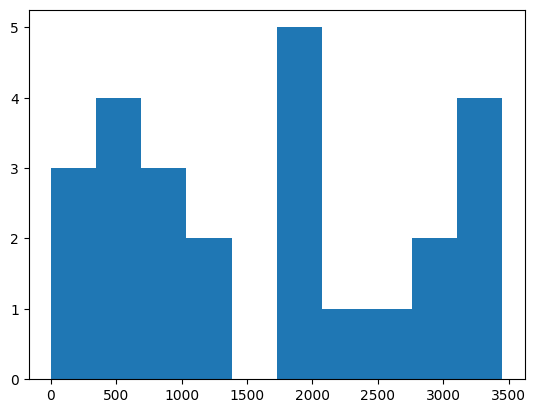

In [50]:
mask = (flat_peaks[1]==50) & (flat_peaks[0] < 300) & (labels > 0)
unique_labels = np.sort(np.unique(labels[mask]))

plt.hist(unique_labels)

(0.0, 300.0)

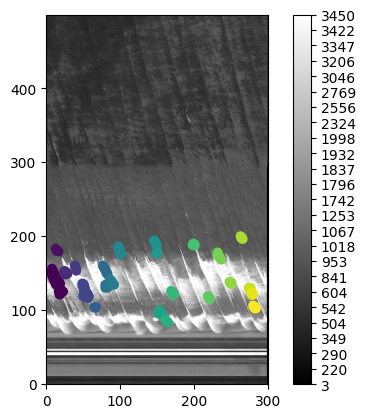

In [52]:
from matplotlib.colors import ListedColormap

mask = (flat_peaks[1]==50) & (flat_peaks[0] < 300) & (labels > 0)
unique_labels = np.sort(np.unique(labels[mask]))

# Create a mapping function from labels to [0, 1] range
label_to_norm = lambda x: np.interp(x, unique_labels, np.linspace(0, 1, len(unique_labels)))

# Create a colormap
cmap = plt.get_cmap('viridis')

# Map each label to its corresponding color
label_colors = cmap(label_to_norm(labels[mask]))

# If you need a ListedColormap for a colorbar
color_map = ListedColormap(cmap(np.linspace(0, 1, len(unique_labels))))

scatter = plt.scatter(
    flat_peaks[0,...][mask],
    flat_peaks[2,...][mask],
    c=label_colors,
    # cmap='viridis'
)
plt.imshow(timestack[:, 50, :].T)
cbar = plt.colorbar(scatter, ticks=np.linspace(0, 1, len(unique_labels)))
cbar.set_ticklabels(unique_labels)

plt.xlim([0, 300])

In [41]:
np.unique(labels[flat_peaks[1]==50])

array([   -1,    16,    36,    62,   194,   292,   357,   469,   483,
         734,  1074,  1104,  1113,  1192,  1219,  1297,  1413,  1610,
        1719,  1727,  1777,  1812,  1825,  1847,  1861,  1992,  2081,
        2106,  2438,  2471,  2554,  2678,  2707,  2747,  2780,  2926,
        2975,  3144,  3169,  3206,  3237,  3407,  3410,  3500,  3516,
        3611,  3895,  3925,  4120,  4188,  4216,  4261,  4363,  4406,
        4584,  4603,  4663,  4699,  4881,  5103,  5414,  5443,  5481,
        5485,  5528,  5634,  5638,  5686,  5739,  5751,  5920,  5972,
        6012,  6424,  6436,  6531,  6577,  6623,  6695,  6723,  6871,
        6966,  7106,  7166,  7170,  7208,  7209,  7362,  7416,  7596,
        7664,  7710,  7727,  7870,  7945,  8099,  8126,  8185,  8298,
        8344,  8642,  8648,  8767,  8843,  8852,  8887,  9026,  9208,
        9244,  9370,  9392,  9483,  9502,  9568,  9653,  9748,  9974,
       10044, 10203, 10329, 10377, 10418, 10512, 10590, 10624, 10638,
       10694, 10944,

(0.0, 400.0)

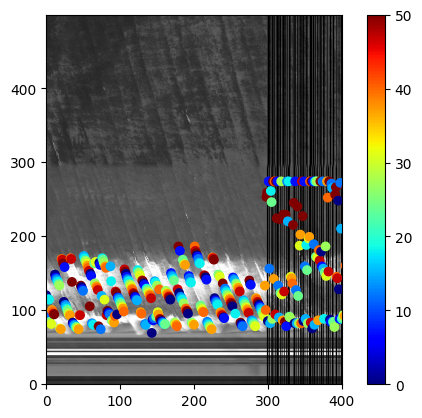

In [88]:
plt.imshow(timestack[:, 50, :].T)
plt.scatter(
    # flat_peaks[0,...][flat_peaks[1]==50],
    np.arange(3840),
    flat_peaks[2,...][flat_peaks[1]==50],
    c=labels[flat_peaks[1]==50],
    cmap='jet',
    vmin=0, vmax=50
)
plt.colorbar()
plt.xlim([0, 400])

(0.0, 500.0)

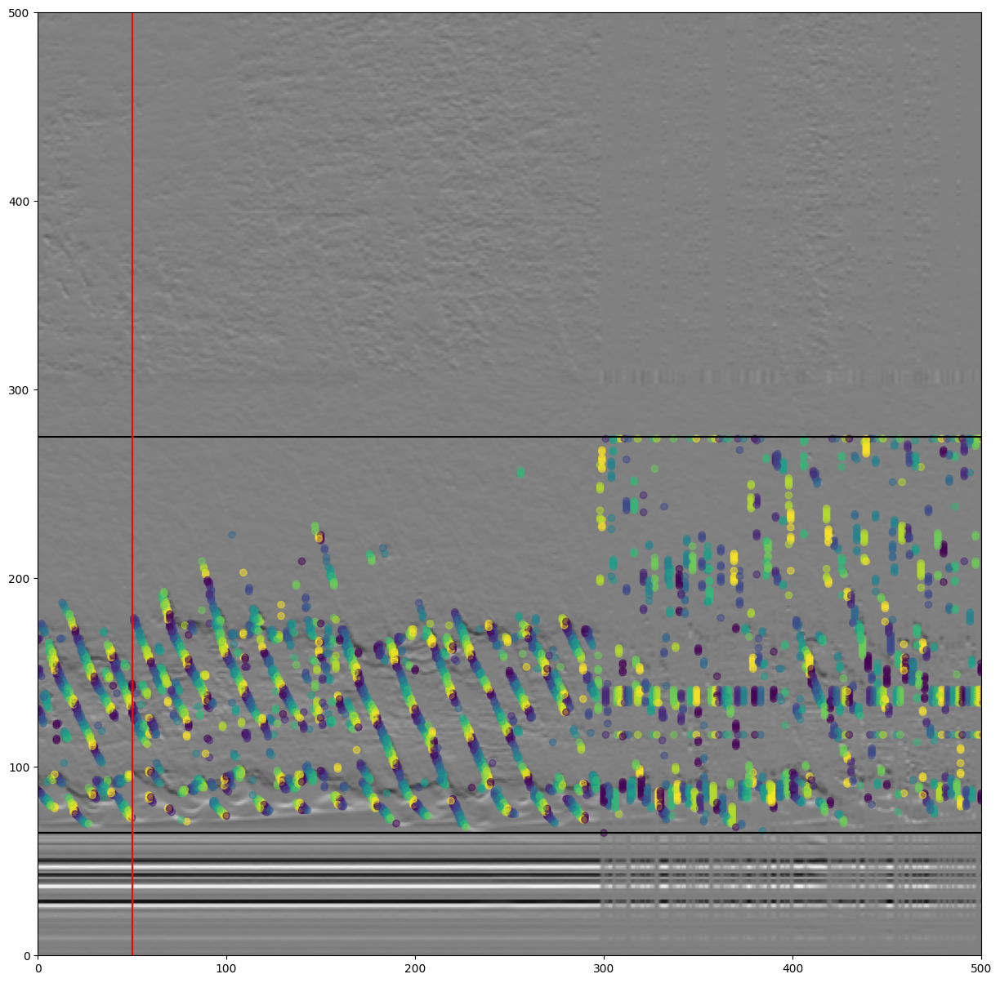

In [96]:
i = 10
plt.figure(figsize=(15, 15))
plt.imshow(sobel(timestack[:, i, :]).T)
c=10
plt.scatter(np.array([np.arange(timestack.shape[0])]*c), peaks[i][:c], c=[np.arange(c)]*timestack.shape[0], cmap='viridis', alpha=0.5)
plt.axhline(surf_zone_min, c='k')
plt.axhline(surf_zone_max, c='k')
plt.axvline(50, c='r')
plt.xlim(0, 500)
plt.ylim(0, 500)

In [97]:
# Trying to do peak finding instead of argmaxing so we get a better spatial distribution

In [98]:
# peaks = []

# for i in tqdm(range(0, timestack.shape[1])):
#     tp = []
#     for j in range(timestack.shape[0]):
#         surf_zone_min = 65
#         surf_zone_max = 275

#         pks= scipy.signal.find_peaks(sobel(timestack[j, i, surf_zone_min:surf_zone_max]))[0]
#         s = np.argsort(np.take(sobel(timestack[j, i, surf_zone_min:surf_zone_max]), pks))[::-1]
#         p = np.take(pks, s)
#         pks = np.zeros(20)
#         pks[:np.min([20, len(p)])] = p[:np.min([20, len(p)])]
#         tp.append(pks+surf_zone_min)
#     peaks.append(tp)

In [99]:
# i = 10
# c=10
# plt.figure(figsize=(15, 15))
# plt.imshow(sobel(timestack[:, i, :]).T)
# p = peaks[i]
# for j, p in enumerate(peaks[i]):
#     p=p[:c]
#     plt.scatter(np.array([j]*len(p)), p, c=[np.arange(len(p))], cmap='viridis', alpha=0.5)
# plt.axhline(surf_zone_min, c='k')
# plt.axhline(surf_zone_max, c='k')
# plt.axvline(50, c='r')
# plt.xlim(0, 500)
# plt.ylim(0, 500)

In [38]:
# DBSCAN to get rid of random points

# This needs some work. I feel like I should be able to get the full wave coming to shore in one piecem at least for some of these. And then maybe merge them w/ ransac?
c = 10
labels = []
for i in range(len(peaks)): # Iterating over alongshore locations
    X = np.array([np.array([np.arange(timestack.shape[0])]*c).flatten(), peaks[i][:c].flatten()])
    clustering = DBSCAN(eps=3, min_samples=10).fit(X.T)
    l = clustering.labels_
    peaks[i] = X[:, l>=0]
    labels.append(l[l>=0])

(0.0, 300.0)

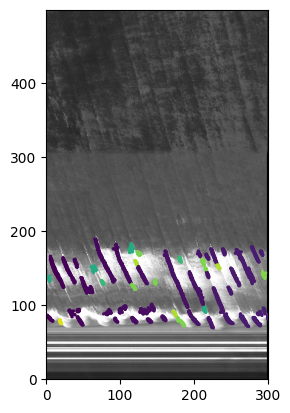

In [41]:
plt.imshow(timestack[:, i, :].T)
plt.scatter(*peaks[i], c=labels[i], s=2, cmap='viridis')
plt.xlim(0, 300)

/var/folders/xv/4vxt441n3tz_yllzvqvzmsgw0000gr/T/ipykernel_19888/3358412411.py:7: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  plt.scatter(*peaks[i][:, labels[i]==j], c=v[j])


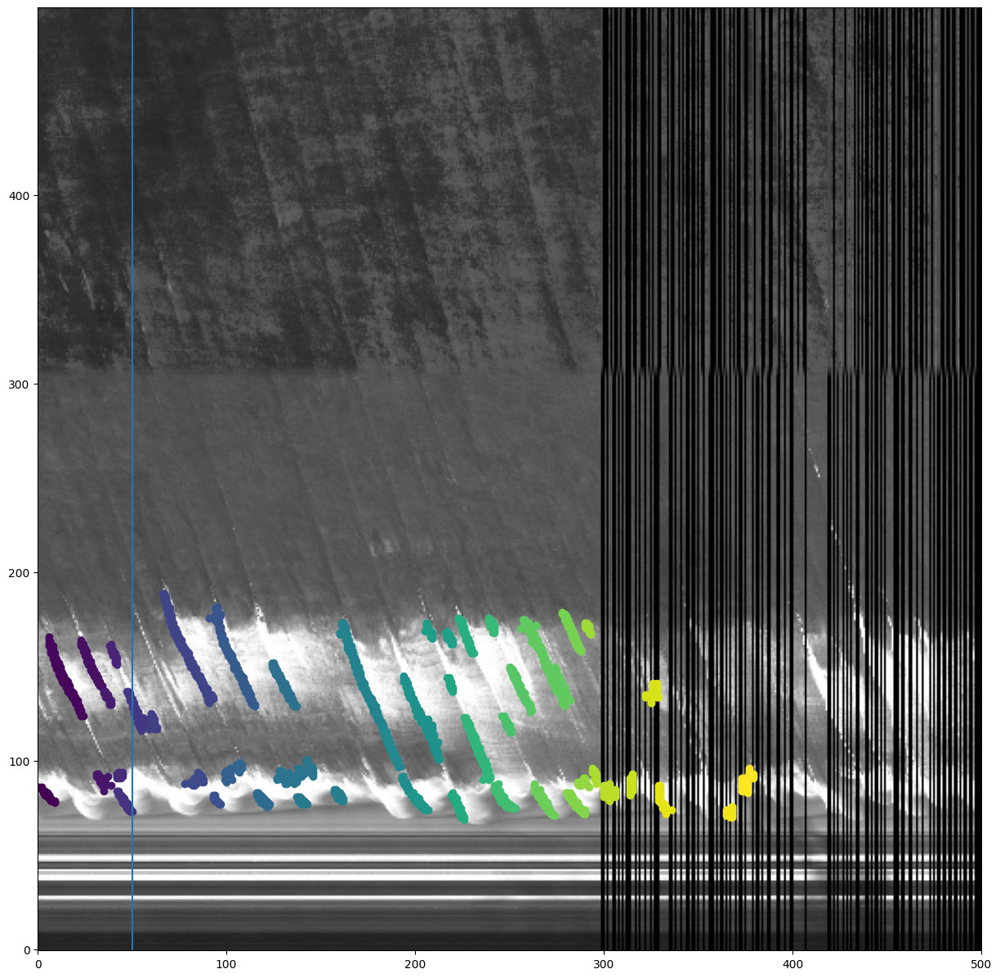

In [42]:
i = 10
plt.figure(figsize=(15, 15))
plt.imshow((timestack[:, i, :]).T)
N = 50
v= plt.get_cmap('viridis', N)(np.arange(N))
for j in range(N):
    plt.scatter(*peaks[i][:, labels[i]==j], c=v[j])
    # plt.scatter(*X[:, labels==1], c='g', alpha=0.5)
plt.xlim(0, 500)
plt.axvline(50)

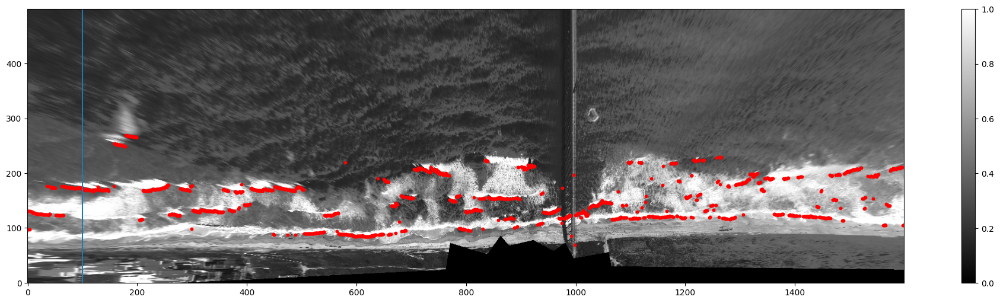

In [103]:
cap = cv2.VideoCapture(os.path.join(dir, file))
f = 51
for _ in range(f):
    _, frame = cap.read()
    frame = frame[..., 0]

c=1
plt.figure(figsize=(25,6))
plt.imshow(frame.T)
for i in range(len(peaks)):
    peak = peaks[i]
    if len(peak) != 0:
        peak = peak[:, peak[0, :]==f]
    if peak.size != 0:
        now_peaks = peak[..., :c]
        # plt.scatter(np.ones_like(now_peaks[1, :]) * i * 10, now_peaks[1, :], s=10, c=np.arange(np.min([now_peaks.shape[-1], c])), cmap='Reds')
        plt.scatter(np.ones_like(now_peaks[1, :]) * i * skip, now_peaks[1, :], s=10, c='r')
# plt.scatter([np.arange(0, 1600, 10)]*c, np.array(peaks)[:, :c, f], s=5, c='r')
plt.axvline(100)
plt.colorbar()

In [104]:
cap = cv2.VideoCapture(os.path.join(dir, file))

N = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
FPS = 2
SECONDS = 100
NFRAMES = FPS * SECONDS
H = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
W = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))

out = cv2.VideoWriter('stingari2021_peak_tracking.avi',cv2.VideoWriter_fourcc('M','J','P','G'), FPS*20, (W,H))
for f in range(NFRAMES):
    _, frame = cap.read()
    # frame = frame[..., 0]

    c=3
    # plt.figure(figsize=(25,6))
    # plt.imshow(frame.T)
    for i in range(len(peaks)):
        peak = peaks[i]
        if len(peak) != 0:
            peak = peak[:, peak[0, :]==f]
        if peak.size != 0:
            now_peaks = peak[..., :c]
            # plt.scatter(np.ones_like(now_peaks[1, :]) * i * 10, now_peaks[1, :], s=10, c='r')#c=np.arange(np.min([now_peaks.shape[-1], c])), cmap='Reds')
            for ic, (iy, ix) in enumerate(zip(np.ones_like(now_peaks[1, :]) * i * skip, now_peaks[1, :])):
                cv2.circle(frame, (ix, iy), 3, (c-ic*50, c-ic*50, 255), -1)
            # frame[np.ones_like(now_peaks[1, :]) * i * 10, now_peaks[1, :]] = (255, 0, 0)
    out.write(frame)
    
cap.release()
out.release()
cv2.destroyAllWindows()
    # plt.scatter([np.arange(0, 1600, 10)]*c, np.array(peaks)[:, :c, f], s=5, c='r')
    # plt.axvline(100)
    # plt.colorbar()
!  ffmpeg -i stingari2021_peak_tracking.avi -t 5 -c:v libx264 stingari2021_peak_tracking_5s.mp4 -y

ffmpeg version 7.0 Copyright (c) 2000-2024 the FFmpeg developers
  built with Apple clang version 15.0.0 (clang-1500.3.9.4)
  configuration: --prefix=/opt/homebrew/Cellar/ffmpeg/7.0_1 --enable-shared --enable-pthreads --enable-version3 --cc=clang --host-cflags= --host-ldflags='-Wl,-ld_classic' --enable-ffplay --enable-gnutls --enable-gpl --enable-libaom --enable-libaribb24 --enable-libbluray --enable-libdav1d --enable-libharfbuzz --enable-libjxl --enable-libmp3lame --enable-libopus --enable-librav1e --enable-librist --enable-librubberband --enable-libsnappy --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtesseract --enable-libtheora --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxml2 --enable-libxvid --enable-lzma --enable-libfontconfig --enable-libfreetype --enable-frei0r --enable-libass --enable-libopencore-amrnb --enable-libopencore-amrwb --enable-libopenjpeg --enable-libopenvino -

In [134]:
breakers = []
for f in range(NFRAMES):
    _, frame = cap.read()
    # frame = frame[..., 0]

    c=10
    # plt.figure(figsize=(25,6))
    # plt.imshow(frame.T)
    for i in range(len(peaks)):
        peak = peaks[i]
        if len(peak) != 0:
            peak = peak[:, peak[0, :]==f]
        if peak.size != 0:
            now_peaks = peak[..., :c]
            breakers.append(np.array([np.ones_like(now_peaks[1, :]) * i * skip, now_peaks[1, :]]))
            # plt.scatter(np.ones_like(now_peaks[1, :]) * i * 10, now_peaks[1, :], s=10, c=np.arange(np.min([now_peaks.shape[-1], c])), cmap='Reds')
breakers = np.hstack(breakers)

count = np.zeros((1600, 500))
for b in breakers.T:
    count[b[0], b[1]]+=1



(array([[485.,  15.,   0., ...,   0.,   0.,   0.],
        [487.,  11.,   2., ...,   0.,   0.,   0.],
        [486.,  14.,   0., ...,   0.,   0.,   0.],
        ...,
        [494.,   6.,   0., ...,   0.,   0.,   0.],
        [493.,   7.,   0., ...,   0.,   0.,   0.],
        [492.,   8.,   0., ...,   0.,   0.,   0.]]),
 array([0.        , 0.00666667, 0.01333333, 0.02      , 0.02666667,
        0.03333333, 0.04      , 0.04666667, 0.05333333, 0.06      ,
        0.06666667]),
 <a list of 1600 BarContainer objects>)

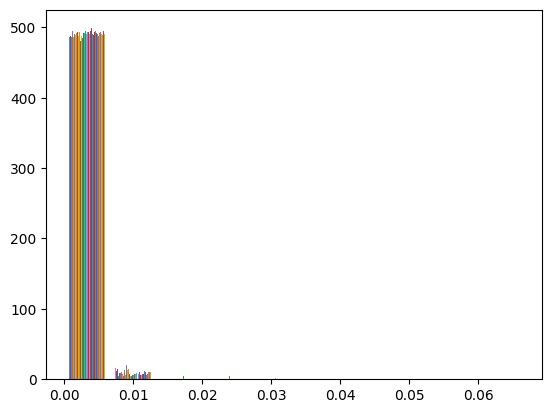

In [136]:
plt.hist(count.T/3840/(1/Tp))

NameError: name 'count' is not defined

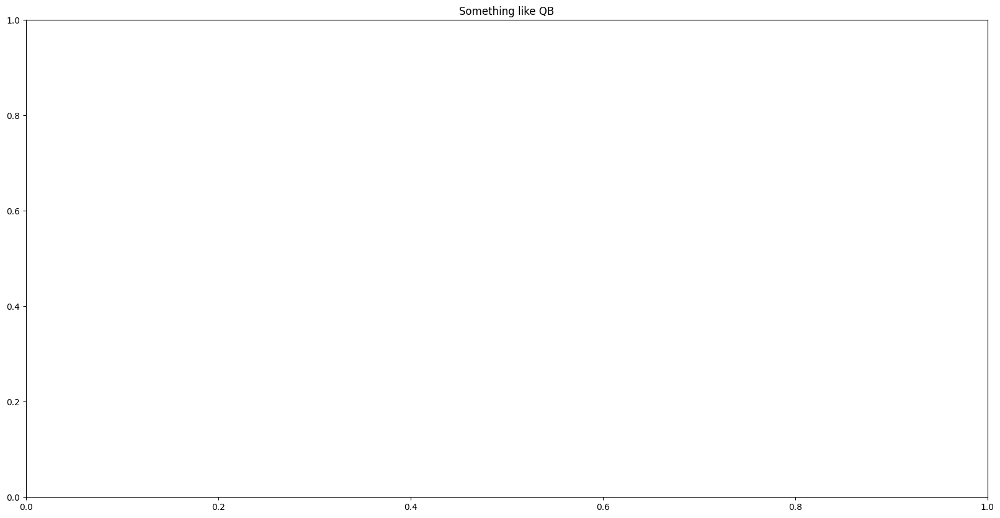

In [89]:
from matplotlib.colors import LogNorm
plt.figure(figsize=(20, 10))
Tp = 7.631857
plt.title('Something like QB')
# plt.imshow(count.T/np.sum(count), cmap='hot') # Breaker Density
# plt.title('Breaker Density')
plt.imshow(count.T/(17*60/Tp), cmap='hot') # Breaker Density Per Peak Period
plt.title('Breaker Density Per Peak Period')
# plt.imshow(count.T/np.sum(count.T, axis=0), cmap='hot', vmin=0.005, vmax=0.04) # along-shore variation of normalized cross shore density
plt.colorbar(fraction=0.046, pad=0.04, shrink=0.6)
plt.figure()
plt.plot((count.T/np.sum(count.T, axis=0)).mean(axis=1))
plt.title('Alongshore average QB')
print((count.T/np.sum(count.T, axis=0)).mean(axis=1).sum())

plt.figure(figsize=(20, 10))
Tp = 8
plt.title('Something like QB anomaly from mean cross shore')
plt.imshow(count.T/np.sum(count.T, axis=0) - (count.T/np.sum(count.T, axis=0)).mean(axis=1)[:, np.newaxis], cmap='bwr', vmin=-0.1, vmax=0.1)
plt.colorbar(fraction=0.046, pad=0.04, shrink=0.6)

plt.figure()
FRF_OFFSET = 71.8535
plt.plot([0, np.sin(39.450039 + FRF_OFFSET)], [0, np.cos(39.450039 + FRF_OFFSET)])
plt.xlim([-1, 1])
plt.ylim([-1, 1])
plt.grid()

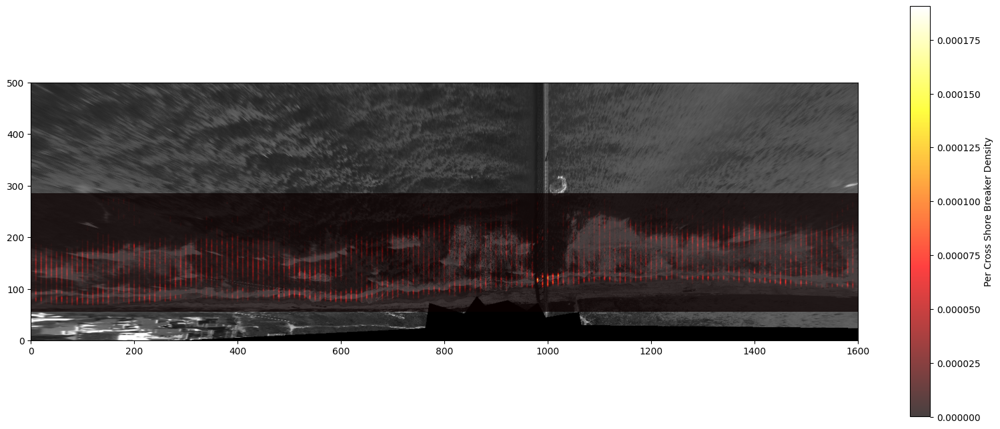

In [29]:
from KDEpy import FFTKDE

cap = cv2.VideoCapture(os.path.join(dir, file))
_, frame = cap.read()
frame = frame[..., :]

b=breakers.T
kde = FFTKDE(kernel='gaussian', norm=2)
grid, points = kde.fit(b).evaluate((3200, surf_zone_max - surf_zone_min))
x, y = np.unique(grid[:, 0]), np.unique(grid[:, 1])
points = points.reshape(3200, surf_zone_max - surf_zone_min)
points = points #/ np.sum(points, axis=1)[:, np.newaxis]
z = points.T

plt.figure(figsize=(20, 8))
plt.imshow(frame[..., 0].T)
contours = 300
# plt.contourf(x, y, z, contours, cmap="hot", alpha=0.75)
plt.pcolormesh(x, y, z, cmap="hot", alpha=0.75)

plt.ylim(0, 500)
plt.xlim(0, 1600)
plt.colorbar(label='Per Cross Shore Breaker Density')


In [252]:
cap = cv2.VideoCapture(os.path.join(dir, file))

N = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
FPS = 2
SECONDS = 100
NFRAMES = FPS * SECONDS
H = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
W = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))

out = cv2.VideoWriter('stingari2021_peak_tracking.avi',cv2.VideoWriter_fourcc('M','J','P','G'), FPS*20, (W,H))
for f in range(NFRAMES):
    _, frame = cap.read()
    # frame = frame[..., 0]

    c=3
    # plt.figure(figsize=(25,6))
    # plt.imshow(frame.T)
    for i in range(len(peaks)):
        peak = peaks[i]
        if len(peak) != 0:
            peak = peak[:, peak[0, :]==f]
        if peak.size != 0:
            now_peaks = peak[..., :c]
        
           
            # plt.scatter(np.ones_like(now_peaks[1, :]) * i * 10, now_peaks[1, :], s=10, c='r')#c=np.arange(np.min([now_peaks.shape[-1], c])), cmap='Reds')
            for ic, (iy, ix) in enumerate(zip(np.ones_like(now_peaks[1, :]) * i * skip, now_peaks[1, :])):
                cv2.circle(frame, (ix, iy), 3, (c-ic*50, c-ic*50, 255), -1)
            # frame[np.ones_like(now_peaks[1, :]) * i * 10, now_peaks[1, :]] = (255, 0, 0)
    out.write(frame)
    
cap.release()
out.release()
cv2.destroyAllWindows()
    # plt.scatter([np.arange(0, 1600, 10)]*c, np.array(peaks)[:, :c, f], s=5, c='r')
    # plt.axvline(100)
    # plt.colorbar()
!  ffmpeg -i stingari2021_peak_tracking.avi -t 5 -c:v libx264 stingari2021_peak_tracking_5s.mp4 -y

ffmpeg version 7.0 Copyright (c) 2000-2024 the FFmpeg developers
  built with Apple clang version 15.0.0 (clang-1500.3.9.4)
  configuration: --prefix=/opt/homebrew/Cellar/ffmpeg/7.0_1 --enable-shared --enable-pthreads --enable-version3 --cc=clang --host-cflags= --host-ldflags='-Wl,-ld_classic' --enable-ffplay --enable-gnutls --enable-gpl --enable-libaom --enable-libaribb24 --enable-libbluray --enable-libdav1d --enable-libharfbuzz --enable-libjxl --enable-libmp3lame --enable-libopus --enable-librav1e --enable-librist --enable-librubberband --enable-libsnappy --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtesseract --enable-libtheora --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxml2 --enable-libxvid --enable-lzma --enable-libfontconfig --enable-libfreetype --enable-frei0r --enable-libass --enable-libopencore-amrnb --enable-libopencore-amrwb --enable-libopenjpeg --enable-libopenvino -

In [ ]:
## Can you dbscan and group the waves into breakers? Can you then track them consistently through time?

In [352]:
c = 3
time_peaks = []
for f in range(NFRAMES):
    space_peaks = np.zeros((2, 3, len(peaks)))
    for i in range(len(peaks)):
        peak = peaks[i]
        if len(peak) != 0:
            peak = peak[:, peak[0, :]==f]
        if peak.size != 0:
            now_peaks = peak[..., :c]
                
            # plt.scatter(np.ones_like(now_peaks[1, :]) * i * 10, now_peaks[1, :], s=10, c='r')#c=np.arange(np.min([now_peaks.shape[-1], c])), cmap='Reds')
            space_peaks[0, :(min(c, len(now_peaks[1, :]))), i] = np.ones_like(now_peaks[1, :]) * i * skip
            space_peaks[1, :(min(c, len(now_peaks[1, :]))), i] = now_peaks[1, :]
            
        # space_peaks.append([])
    time_peaks.append(space_peaks)
len(time_peaks)

200

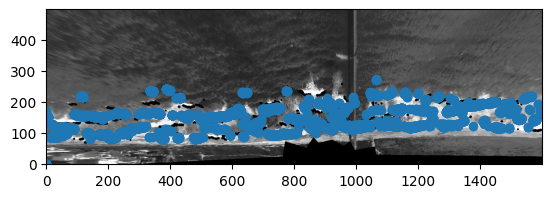

In [353]:
plt.imshow(frame[..., 0].T)
plt.scatter(*time_peaks[0])

In [119]:
i = 2
p = time_peaks[i].reshape(2, -1)
p = p[:, (p[0, :] > 0) & (p[1, :] > 0)].T
plt.scatter(*p.T)
clustering = DBSCAN(eps=3, min_samples=10).fit(p)
l = clustering.labels_
# time_peaks[i] = p[l>=0]
plt.imshow(frame)
plt.scatter(*p[l>=0].T, c=l[l>=0], cmap='jet')



NameError: name 'time_peaks' is not defined

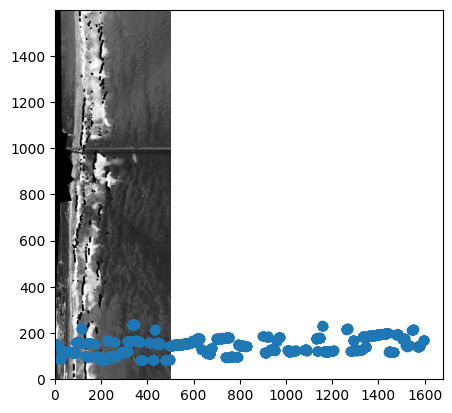

In [355]:
time_labels = []
for i in range(len(time_peaks)):
    p = time_peaks[i].reshape(2, -1)
    p = p[:, (p[0, :] > 0) & (p[1, :] > 0)].T
    # p=p[(p[:, 0] > 0) & (p[:, 1] > 0)]
    clustering = DBSCAN(eps=3, min_samples=10).fit(p)
    l = clustering.labels_
    time_peaks[i] = p[l>=0]
    time_labels.append(l[l>=0])
    
plt.imshow(frame[..., 0].T)
plt.scatter(*time_peaks[0].T)

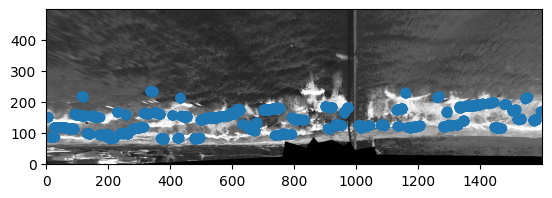

In [363]:
plt.imshow(frame[..., 0].T)
plt.scatter(*time_peaks[0].T)

In [373]:
cap = cv2.VideoCapture(os.path.join(dir, file))

N = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
FPS = 2
SECONDS = 100
NFRAMES = FPS * SECONDS
H = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
W = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))

v= plt.get_cmap('viridis', 128)(np.arange(128))

out = cv2.VideoWriter('stingari2021_peak_tracking.avi',cv2.VideoWriter_fourcc('M','J','P','G'), FPS*20, (W,H))
for f in range(NFRAMES):
    _, frame = cap.read()
    # frame = frame[..., 0]

    for l, coord in zip(time_labels[f], time_peaks[f].astype(int)):
        cv2.circle(frame, (coord[1], coord[0]), 3, v[l][:3], -1)
    out.write(frame)
    
cap.release()
out.release()
cv2.destroyAllWindows()
!  ffmpeg -i stingari2021_peak_tracking.avi -t 5 -c:v libx264 stingari2021_peak_tracking_5s.mp4 -y

ffmpeg version 7.0 Copyright (c) 2000-2024 the FFmpeg developers
  built with Apple clang version 15.0.0 (clang-1500.3.9.4)
  configuration: --prefix=/opt/homebrew/Cellar/ffmpeg/7.0_1 --enable-shared --enable-pthreads --enable-version3 --cc=clang --host-cflags= --host-ldflags='-Wl,-ld_classic' --enable-ffplay --enable-gnutls --enable-gpl --enable-libaom --enable-libaribb24 --enable-libbluray --enable-libdav1d --enable-libharfbuzz --enable-libjxl --enable-libmp3lame --enable-libopus --enable-librav1e --enable-librist --enable-librubberband --enable-libsnappy --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtesseract --enable-libtheora --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxml2 --enable-libxvid --enable-lzma --enable-libfontconfig --enable-libfreetype --enable-frei0r --enable-libass --enable-libopencore-amrnb --enable-libopencore-amrwb --enable-libopenjpeg --enable-libopenvino -

In [ ]:
## Can you identify the non-breaking waves? I think this is either going to be super hard or there's some easy signal processing thing. 
# The gradients are weak, but if we assume constant velocity we can just draw lines from the breakers (assuming we get all the breakers)

(0.0, 500.0)

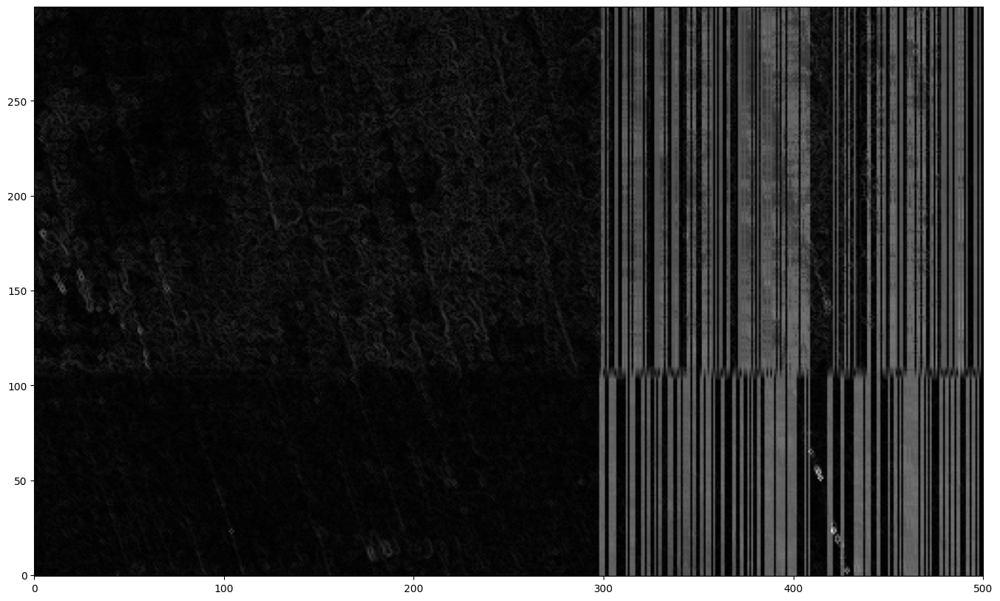

In [159]:
plt.figure(figsize=(20, 10))
xmax=500
plt.imshow(np.linalg.norm(np.array(np.gradient(timestack[:xmax, 10, 200:].T)), axis=0))
# plt.scatter(np.arange(xmax), peaks[:xmax, 10, :][:, 0])
plt.xlim(0 ,xmax)

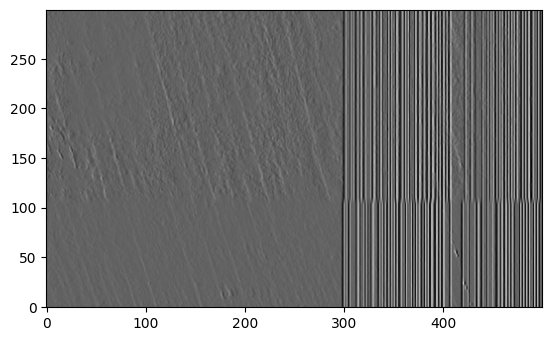

In [161]:
plt.imshow(sobel(timestack[:xmax, 10, 200:].T))